In [1]:
import torch
import torchvision
from tqdm import tqdm
import argparse
import os
import sys
# Try to get torchinfo, install it if it doesn't work

from com.common_packages import check_if_dir_existed
from com.colors import COLOR
import matplotlib.pyplot as plt

#from dataset import get_datasets
#from dataset import get_data_loaders
#from dataset import show_batch_grid
from models import efficientnet
from models import densenet
import config
import time
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = False
from dataset import load_dataset

import dataset
import numpy as np
import utils
print(config.CFG.epochs)
import engine

torch.Size([4, 10]) torch.Size([4, 3, 224, 224])
100


In [2]:
DATA = 'weather_2'
dataset=f'/media/igofed/SSD_2T/DATASETS/{DATA}'
model_name='efficientnet_b0'
train_path = os.path.join(dataset, 'train')
valid_path = os.path.join(dataset, 'valid')
test_path = os.path.join(dataset, 'test')
check_if_dir_existed(train_path)
check_if_dir_existed(valid_path)
check_if_dir_existed(test_path)
device = utils.select_device(gpu=True)
print(device)

folder 		: /media/igofed/SSD_2T/DATASETS/weather_2/train is available
folder 		: /media/igofed/SSD_2T/DATASETS/weather_2/valid is available
folder 		: /media/igofed/SSD_2T/DATASETS/weather_2/test is available
cuda:0


 [INFO]: Custom Loader for :	 train data 
Classes {'Class0': 0, 'Class1': 1} 
[INFO]: train Set:	2254
	[INFO]: 705:	Class0 31.3%
	[INFO]: 1549:	Class1 68.7%
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/train/Class0 705  Images 
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/train/Class1 1549  Images 

[INFO] : Original train Set Size: 	2254
	Num. of batches: 		71
	Num. of total examples: 	2254
 ---------------------------------------
Folder 		: /home/igofed/LiU/AI4Climate_/src/figures is available
/home/igofed/LiU/AI4Climate_/src/figures/Balanced_train_20221205-173726.png
Class names: ['Class0', 'Class1']


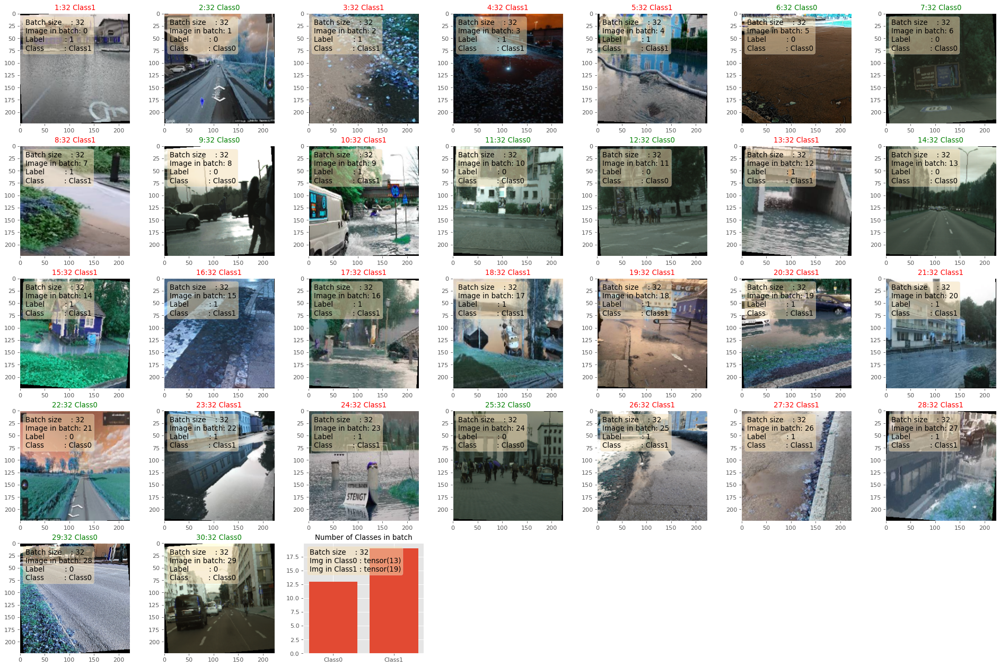

In [3]:
train_set, train_loader = load_dataset(train_path, mode='train', balance_dataset=True)
class_names = train_set.classes
utils.show_batch_grid(train_loader, True, 'train', True)
print(f"Class names: {class_names}")


Create Train and Valid loader

 [INFO]: Custom Loader for :	 valid data 
Classes {'Class0': 0, 'Class1': 1} 
[INFO]: valid Set:	2254
	[INFO]: 705:	Class0 31.3%
	[INFO]: 1549:	Class1 68.7%
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/train/Class0 705  Images 
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/train/Class1 1549  Images 

[INFO] : Original valid Set Size: 	2254
	Num. of batches: 		71
	Num. of total examples: 	2254
 ---------------------------------------
Folder 		: /home/igofed/LiU/AI4Climate_/src/figures is available
/home/igofed/LiU/AI4Climate_/src/figures/Balanced_valid_20221205-173821.png


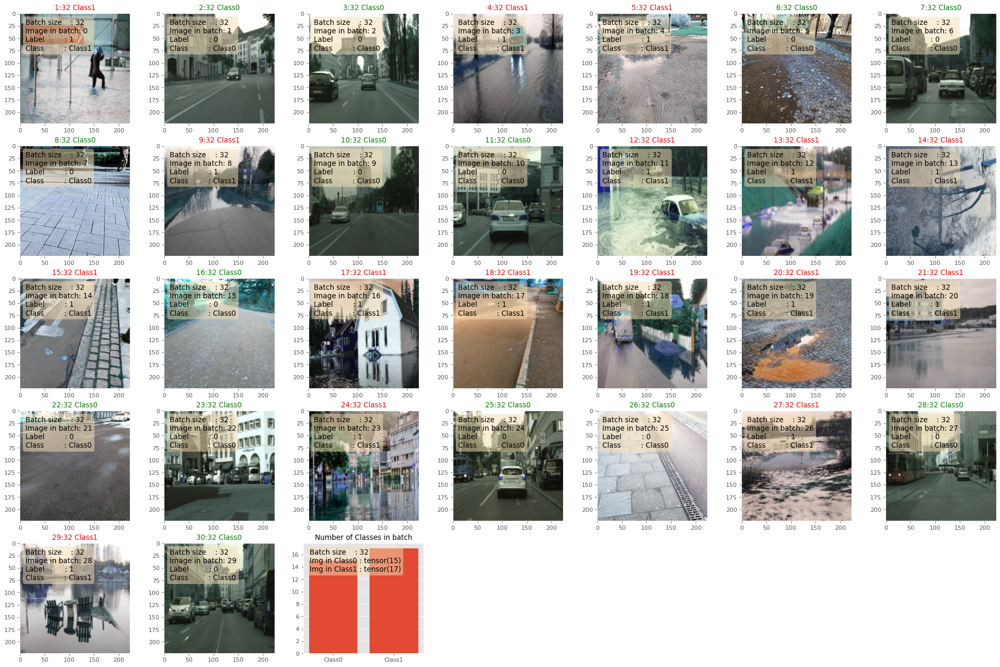

In [4]:
valid_set, valid_loader = load_dataset(train_path, mode='valid', balance_dataset=True)
utils.show_batch_grid(valid_loader, True, 'valid', True)

 [INFO]: Custom Loader for :	 test data 
Classes {'Class0': 0, 'Class1': 1} 
[INFO]: test Set:	477
	[INFO]: 144:	Class0 30.2%
	[INFO]: 333:	Class1 69.8%
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/test/Class0 144  Images 
 [INFO] In /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1 333  Images 

[INFO] : Original test Set Size: 	477
	Num. of batches: 		15
	Num. of total examples: 	477
 ---------------------------------------
Folder 		: /home/igofed/LiU/AI4Climate_/src/figures is available
/home/igofed/LiU/AI4Climate_/src/figures/Balanced_test_20221205-173838.png


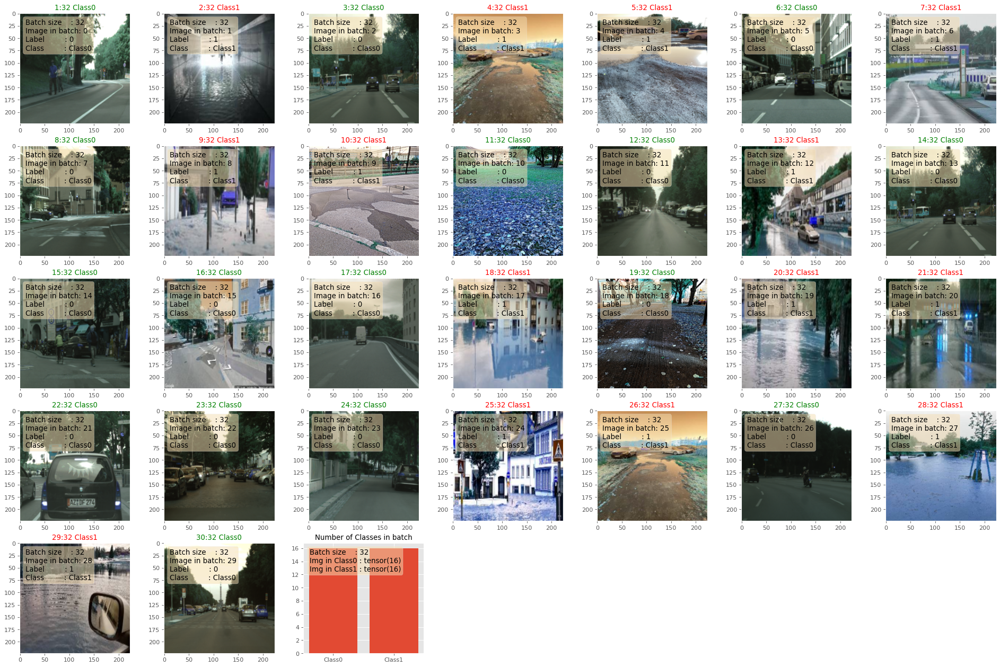

In [5]:
test_set, test_loader = load_dataset(test_path, mode='test', balance_dataset=True)
utils.show_batch_grid(test_loader, True, 'test', True)

In [6]:
model = efficientnet.EfficientNet(
        version="efficientnet_b0",
        num_classes=2,
    ).to(device)
print('Done')

Done


In [7]:
def define_loss() -> torch.nn.CrossEntropyLoss:
    criterion = torch.nn.CrossEntropyLoss()
    criterion = criterion.to(device=config.device, memory_format=torch.channels_last)
    return criterion

def define_optimizer(model) -> torch.optim.SGD:
    optimizer = torch.optim.SGD(model.parameters(), lr=config.CFG.learning_rate)
    return optimizer

    
criterion = define_loss()
print(COLOR.BGreen, "Define all loss functions successfully.", COLOR.END)

optimizer = define_optimizer(model)
print(COLOR.BGreen,"Define all optimizer functions successfully.", COLOR.END)
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau
scheduler_params = dict(
        mode='min',
        factor=0.5,
        patience=1,
        verbose=False, 
        threshold=0.0001,
        threshold_mode='abs',
        cooldown=0, 
        min_lr=1e-8,
        eps=1e-08
    )


 Define all loss functions successfully. 
 Define all optimizer functions successfully. 


In [8]:
output_paths = os.path.join(os.getcwd(), 'outputs')
check_if_dir_existed(output_paths, True)
last_checkpoint = f"{output_paths}/{model_name}_{DATA}_{'last_checkpoint'}.bin"
best_checkpoint = f"{output_paths}/{model_name}_{DATA}_{'best_checkpoint'}.bin"
log_path = f"{output_paths}/{model_name}_{DATA}_{'log'}.txt"
print('###########################')
print(last_checkpoint)
print(best_checkpoint)
print(log_path)
print('###########################')

folder 		: /home/igofed/LiU/AI4Climate_/src/outputs is available
###########################
/home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin
/home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin
/home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_log.txt
###########################


In [9]:
__trainer = engine.Trainer(
                        model, 
                        model_name, 
                        device, 
                        batch_size=config.CFG.batch_size,
                        criterion=criterion, 
                        optimizer=optimizer, 
                        epochs=config.CFG.epochs, 
                        learning_rate=config.CFG.learning_rate, 
                        scheduler=scheduler, 
                        scheduler_params=scheduler_params
                        )


In [10]:
__trainer.fit(train_loader, valid_loader, last_checkpoint, best_checkpoint, log_path)

 [INFO] training the network... 

2022-12-05T16:38:52.830580
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.20it/s]


[RESULT]: Train. Epoch 1 of 100train_loss: 0.696, train_acc: 0.530time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:05<00:00, 13.23it/s]


[RESULT]: Valid. Epoch 1 of 100valid_loss: 0.697, train_acc: 0.491time: 5 s
 Valid_loss decreased inf --> 0.697302415337361
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 1 of 100
	 Train loss: 0.696, Train acc: 0.530
	 Valid loss: 0.697, Valid acc: 0.491

2022-12-05T16:39:07.059432
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.55it/s]


[RESULT]: Train. Epoch 2 of 100train_loss: 0.696, train_acc: 0.529time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.32it/s]


[RESULT]: Valid. Epoch 2 of 100valid_loss: 0.696, train_acc: 0.479time: 4 s
 Valid_loss decreased 0.697302415337361 --> 0.6958627658830562
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 2 of 100
	 Train loss: 0.696, Train acc: 0.529
	 Valid loss: 0.696, Valid acc: 0.479

2022-12-05T16:39:19.951847
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.54it/s]


[RESULT]: Train. Epoch 3 of 100train_loss: 0.686, train_acc: 0.552time: 9 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.36it/s]


[RESULT]: Valid. Epoch 3 of 100valid_loss: 0.690, train_acc: 0.518time: 4 s
 Valid_loss decreased 0.6958627658830562 --> 0.6901135688096705
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 3 of 100
	 Train loss: 0.686, Train acc: 0.552
	 Valid loss: 0.690, Valid acc: 0.518

2022-12-05T16:39:33.123188
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.71it/s]


[RESULT]: Train. Epoch 4 of 100train_loss: 0.690, train_acc: 0.538time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 15.42it/s]


[RESULT]: Valid. Epoch 4 of 100valid_loss: 0.688, train_acc: 0.522time: 4 s
 Valid_loss decreased 0.6901135688096705 --> 0.6875422252735621
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 4 of 100
	 Train loss: 0.690, Train acc: 0.538
	 Valid loss: 0.688, Valid acc: 0.522

2022-12-05T16:39:46.129502
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.43it/s]


[RESULT]: Train. Epoch 5 of 100train_loss: 0.688, train_acc: 0.542time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.19it/s]


[RESULT]: Valid. Epoch 5 of 100valid_loss: 0.689, train_acc: 0.512time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 5 of 100
	 Train loss: 0.688, Train acc: 0.542
	 Valid loss: 0.689, Valid acc: 0.512

2022-12-05T16:39:58.818746
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.93it/s]


[RESULT]: Train. Epoch 6 of 100train_loss: 0.682, train_acc: 0.569time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.87it/s]


[RESULT]: Valid. Epoch 6 of 100valid_loss: 0.687, train_acc: 0.518time: 4 s
 Valid_loss decreased 0.6875422252735621 --> 0.6870985106683113
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 6 of 100
	 Train loss: 0.682, Train acc: 0.569
	 Valid loss: 0.687, Valid acc: 0.518

2022-12-05T16:40:11.219124
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.99it/s]


[RESULT]: Train. Epoch 7 of 100train_loss: 0.680, train_acc: 0.585time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.97it/s]


[RESULT]: Valid. Epoch 7 of 100valid_loss: 0.685, train_acc: 0.522time: 4 s
 Valid_loss decreased 0.6870985106683113 --> 0.685247862003219
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 7 of 100
	 Train loss: 0.680, Train acc: 0.585
	 Valid loss: 0.685, Valid acc: 0.522

2022-12-05T16:40:23.558660
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.94it/s]


[RESULT]: Train. Epoch 8 of 100train_loss: 0.675, train_acc: 0.578time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.80it/s]


[RESULT]: Valid. Epoch 8 of 100valid_loss: 0.689, train_acc: 0.493time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 8 of 100
	 Train loss: 0.675, Train acc: 0.578
	 Valid loss: 0.689, Valid acc: 0.493

2022-12-05T16:40:35.864019
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.88it/s]


[RESULT]: Train. Epoch 9 of 100train_loss: 0.676, train_acc: 0.570time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.50it/s]


[RESULT]: Valid. Epoch 9 of 100valid_loss: 0.677, train_acc: 0.543time: 5 s
 Valid_loss decreased 0.685247862003219 --> 0.6773249590900582
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 9 of 100
	 Train loss: 0.676, Train acc: 0.570
	 Valid loss: 0.677, Valid acc: 0.543

2022-12-05T16:40:48.398627
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.96it/s]


[RESULT]: Train. Epoch 10 of 100train_loss: 0.670, train_acc: 0.602time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.61it/s]


[RESULT]: Valid. Epoch 10 of 100valid_loss: 0.664, train_acc: 0.568time: 4 s
 Valid_loss decreased 0.6773249590900582 --> 0.664089537842173
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 10 of 100
	 Train loss: 0.670, Train acc: 0.602
	 Valid loss: 0.664, Valid acc: 0.568

2022-12-05T16:41:00.839216
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.93it/s]


[RESULT]: Train. Epoch 11 of 100train_loss: 0.658, train_acc: 0.613time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.23it/s]


[RESULT]: Valid. Epoch 11 of 100valid_loss: 0.655, train_acc: 0.538time: 4 s
 Valid_loss decreased 0.664089537842173 --> 0.6553926039749468
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 11 of 100
	 Train loss: 0.658, Train acc: 0.613
	 Valid loss: 0.655, Valid acc: 0.538

2022-12-05T16:41:13.140707
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.86it/s]


[RESULT]: Train. Epoch 12 of 100train_loss: 0.637, train_acc: 0.664time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.10it/s]


[RESULT]: Valid. Epoch 12 of 100valid_loss: 0.613, train_acc: 0.602time: 4 s
 Valid_loss decreased 0.6553926039749468 --> 0.6126121316157597
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 12 of 100
	 Train loss: 0.637, Train acc: 0.664
	 Valid loss: 0.613, Valid acc: 0.602

2022-12-05T16:41:25.551626
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.00it/s]


[RESULT]: Train. Epoch 13 of 100train_loss: 0.606, train_acc: 0.705time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.98it/s]


[RESULT]: Valid. Epoch 13 of 100valid_loss: 0.569, train_acc: 0.710time: 4 s
 Valid_loss decreased 0.6126121316157597 --> 0.5688170908202588
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 13 of 100
	 Train loss: 0.606, Train acc: 0.705
	 Valid loss: 0.569, Valid acc: 0.710

2022-12-05T16:41:37.865769
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.97it/s]


[RESULT]: Train. Epoch 14 of 100train_loss: 0.556, train_acc: 0.757time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.74it/s]


[RESULT]: Valid. Epoch 14 of 100valid_loss: 0.496, train_acc: 0.776time: 5 s
 Valid_loss decreased 0.5688170908202588 --> 0.49564051040461365
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 14 of 100
	 Train loss: 0.556, Train acc: 0.757
	 Valid loss: 0.496, Valid acc: 0.776

2022-12-05T16:41:50.267352
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.99it/s]


[RESULT]: Train. Epoch 15 of 100train_loss: 0.534, train_acc: 0.759time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.13it/s]


[RESULT]: Valid. Epoch 15 of 100valid_loss: 0.433, train_acc: 0.825time: 4 s
 Valid_loss decreased 0.49564051040461365 --> 0.4328592851967879
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 15 of 100
	 Train loss: 0.534, Train acc: 0.759
	 Valid loss: 0.433, Valid acc: 0.825

2022-12-05T16:42:02.549921
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.87it/s]


[RESULT]: Train. Epoch 16 of 100train_loss: 0.494, train_acc: 0.796time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.26it/s]


[RESULT]: Valid. Epoch 16 of 100valid_loss: 0.415, train_acc: 0.833time: 4 s
 Valid_loss decreased 0.4328592851967879 --> 0.41486979706186644
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 16 of 100
	 Train loss: 0.494, Train acc: 0.796
	 Valid loss: 0.415, Valid acc: 0.833

2022-12-05T16:42:14.917699
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 17 of 100train_loss: 0.467, train_acc: 0.805time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.80it/s]


[RESULT]: Valid. Epoch 17 of 100valid_loss: 0.395, train_acc: 0.832time: 5 s
 Valid_loss decreased 0.41486979706186644 --> 0.3949058716985541
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 17 of 100
	 Train loss: 0.467, Train acc: 0.805
	 Valid loss: 0.395, Valid acc: 0.832

2022-12-05T16:42:27.368245
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.83it/s]


[RESULT]: Train. Epoch 18 of 100train_loss: 0.429, train_acc: 0.822time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.31it/s]


[RESULT]: Valid. Epoch 18 of 100valid_loss: 0.338, train_acc: 0.859time: 4 s
 Valid_loss decreased 0.3949058716985541 --> 0.3375970826182567
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 18 of 100
	 Train loss: 0.429, Train acc: 0.822
	 Valid loss: 0.338, Valid acc: 0.859

2022-12-05T16:42:39.745822
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.92it/s]


[RESULT]: Train. Epoch 19 of 100train_loss: 0.403, train_acc: 0.836time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.20it/s]


[RESULT]: Valid. Epoch 19 of 100valid_loss: 0.320, train_acc: 0.873time: 4 s
 Valid_loss decreased 0.3375970826182567 --> 0.32007645889067315
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 19 of 100
	 Train loss: 0.403, Train acc: 0.836
	 Valid loss: 0.320, Valid acc: 0.873

2022-12-05T16:42:52.067927
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.83it/s]


[RESULT]: Train. Epoch 20 of 100train_loss: 0.406, train_acc: 0.829time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.97it/s]


[RESULT]: Valid. Epoch 20 of 100valid_loss: 0.299, train_acc: 0.884time: 4 s
 Valid_loss decreased 0.32007645889067315 --> 0.2985606233418827
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 20 of 100
	 Train loss: 0.406, Train acc: 0.829
	 Valid loss: 0.299, Valid acc: 0.884

2022-12-05T16:43:04.526226
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.90it/s]


[RESULT]: Train. Epoch 21 of 100train_loss: 0.377, train_acc: 0.842time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.94it/s]


[RESULT]: Valid. Epoch 21 of 100valid_loss: 0.290, train_acc: 0.879time: 4 s
 Valid_loss decreased 0.2985606233418827 --> 0.29043600047138374
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 21 of 100
	 Train loss: 0.377, Train acc: 0.842
	 Valid loss: 0.290, Valid acc: 0.879

2022-12-05T16:43:16.937732
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.94it/s]


[RESULT]: Train. Epoch 22 of 100train_loss: 0.368, train_acc: 0.858time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.98it/s]


[RESULT]: Valid. Epoch 22 of 100valid_loss: 0.288, train_acc: 0.884time: 5 s
 Valid_loss decreased 0.29043600047138374 --> 0.28802226106045953
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 22 of 100
	 Train loss: 0.368, Train acc: 0.858
	 Valid loss: 0.288, Valid acc: 0.884

2022-12-05T16:43:29.298117
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 23 of 100train_loss: 0.348, train_acc: 0.861time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.34it/s]


[RESULT]: Valid. Epoch 23 of 100valid_loss: 0.260, train_acc: 0.911time: 4 s
 Valid_loss decreased 0.28802226106045953 --> 0.2604572917793838
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 23 of 100
	 Train loss: 0.348, Train acc: 0.861
	 Valid loss: 0.260, Valid acc: 0.911

2022-12-05T16:43:41.608143
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.99it/s]


[RESULT]: Train. Epoch 24 of 100train_loss: 0.343, train_acc: 0.862time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.28it/s]


[RESULT]: Valid. Epoch 24 of 100valid_loss: 0.316, train_acc: 0.885time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 24 of 100
	 Train loss: 0.343, Train acc: 0.862
	 Valid loss: 0.316, Valid acc: 0.885

2022-12-05T16:43:53.745421
LR: 0.001
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.97it/s]


[RESULT]: Train. Epoch 25 of 100train_loss: 0.301, train_acc: 0.888time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.73it/s]


[RESULT]: Valid. Epoch 25 of 100valid_loss: 0.276, train_acc: 0.894time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 25 of 100
	 Train loss: 0.301, Train acc: 0.888
	 Valid loss: 0.276, Valid acc: 0.894

2022-12-05T16:44:06.034383
LR: 0.0005
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.95it/s]


[RESULT]: Train. Epoch 26 of 100train_loss: 0.301, train_acc: 0.881time: 7 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.17it/s]


[RESULT]: Valid. Epoch 26 of 100valid_loss: 0.223, train_acc: 0.912time: 5 s
 Valid_loss decreased 0.2604572917793838 --> 0.22327218939300994
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 26 of 100
	 Train loss: 0.301, Train acc: 0.881
	 Valid loss: 0.223, Valid acc: 0.912

2022-12-05T16:44:18.346084
LR: 0.0005
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.92it/s]


[RESULT]: Train. Epoch 27 of 100train_loss: 0.287, train_acc: 0.885time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.08it/s]


[RESULT]: Valid. Epoch 27 of 100valid_loss: 0.234, train_acc: 0.905time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 27 of 100
	 Train loss: 0.287, Train acc: 0.885
	 Valid loss: 0.234, Valid acc: 0.905

2022-12-05T16:44:30.599912
LR: 0.0005
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.91it/s]


[RESULT]: Train. Epoch 28 of 100train_loss: 0.296, train_acc: 0.891time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.05it/s]


[RESULT]: Valid. Epoch 28 of 100valid_loss: 0.249, train_acc: 0.907time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 28 of 100
	 Train loss: 0.296, Train acc: 0.891
	 Valid loss: 0.249, Valid acc: 0.907

2022-12-05T16:44:42.875667
LR: 0.00025
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.00it/s]


[RESULT]: Train. Epoch 29 of 100train_loss: 0.295, train_acc: 0.882time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.88it/s]


[RESULT]: Valid. Epoch 29 of 100valid_loss: 0.215, train_acc: 0.912time: 4 s
 Valid_loss decreased 0.22327218939300994 --> 0.2151001513424054
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 29 of 100
	 Train loss: 0.295, Train acc: 0.882
	 Valid loss: 0.215, Valid acc: 0.912

2022-12-05T16:44:55.223954
LR: 0.00025
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.92it/s]


[RESULT]: Train. Epoch 30 of 100train_loss: 0.279, train_acc: 0.901time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.71it/s]


[RESULT]: Valid. Epoch 30 of 100valid_loss: 0.237, train_acc: 0.910time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 30 of 100
	 Train loss: 0.279, Train acc: 0.901
	 Valid loss: 0.237, Valid acc: 0.910

2022-12-05T16:45:07.569620
LR: 0.00025
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.88it/s]


[RESULT]: Train. Epoch 31 of 100train_loss: 0.277, train_acc: 0.897time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.12it/s]


[RESULT]: Valid. Epoch 31 of 100valid_loss: 0.223, train_acc: 0.914time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 31 of 100
	 Train loss: 0.277, Train acc: 0.897
	 Valid loss: 0.223, Valid acc: 0.914

2022-12-05T16:45:19.847329
LR: 0.000125
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 32 of 100train_loss: 0.293, train_acc: 0.889time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.46it/s]


[RESULT]: Valid. Epoch 32 of 100valid_loss: 0.216, train_acc: 0.916time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 32 of 100
	 Train loss: 0.293, Train acc: 0.889
	 Valid loss: 0.216, Valid acc: 0.916

2022-12-05T16:45:32.288965
LR: 0.000125
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.93it/s]


[RESULT]: Train. Epoch 33 of 100train_loss: 0.267, train_acc: 0.906time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.55it/s]


[RESULT]: Valid. Epoch 33 of 100valid_loss: 0.231, train_acc: 0.913time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 33 of 100
	 Train loss: 0.267, Train acc: 0.906
	 Valid loss: 0.231, Valid acc: 0.913

2022-12-05T16:45:44.418912
LR: 6.25e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.92it/s]


[RESULT]: Train. Epoch 34 of 100train_loss: 0.287, train_acc: 0.894time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.38it/s]


[RESULT]: Valid. Epoch 34 of 100valid_loss: 0.203, train_acc: 0.925time: 4 s
 Valid_loss decreased 0.2151001513424054 --> 0.20270402472413762
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 34 of 100
	 Train loss: 0.287, Train acc: 0.894
	 Valid loss: 0.203, Valid acc: 0.925

2022-12-05T16:45:56.710505
LR: 6.25e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 35 of 100train_loss: 0.267, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.62it/s]


[RESULT]: Valid. Epoch 35 of 100valid_loss: 0.207, train_acc: 0.920time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 35 of 100
	 Train loss: 0.267, Train acc: 0.899
	 Valid loss: 0.207, Valid acc: 0.920

2022-12-05T16:46:09.098291
LR: 6.25e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.85it/s]


[RESULT]: Train. Epoch 36 of 100train_loss: 0.277, train_acc: 0.894time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.72it/s]


[RESULT]: Valid. Epoch 36 of 100valid_loss: 0.242, train_acc: 0.902time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 36 of 100
	 Train loss: 0.277, Train acc: 0.894
	 Valid loss: 0.242, Valid acc: 0.902

2022-12-05T16:46:21.497223
LR: 3.125e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.86it/s]


[RESULT]: Train. Epoch 37 of 100train_loss: 0.279, train_acc: 0.892time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.02it/s]


[RESULT]: Valid. Epoch 37 of 100valid_loss: 0.220, train_acc: 0.918time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 37 of 100
	 Train loss: 0.279, Train acc: 0.892
	 Valid loss: 0.220, Valid acc: 0.918

2022-12-05T16:46:33.817337
LR: 3.125e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.98it/s]


[RESULT]: Train. Epoch 38 of 100train_loss: 0.259, train_acc: 0.904time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.03it/s]


[RESULT]: Valid. Epoch 38 of 100valid_loss: 0.216, train_acc: 0.916time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 38 of 100
	 Train loss: 0.259, Train acc: 0.904
	 Valid loss: 0.216, Valid acc: 0.916

2022-12-05T16:46:46.027953
LR: 1.5625e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.95it/s]


[RESULT]: Train. Epoch 39 of 100train_loss: 0.278, train_acc: 0.895time: 7 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.23it/s]


[RESULT]: Valid. Epoch 39 of 100valid_loss: 0.238, train_acc: 0.914time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 39 of 100
	 Train loss: 0.278, Train acc: 0.895
	 Valid loss: 0.238, Valid acc: 0.914

2022-12-05T16:46:58.228472
LR: 1.5625e-05
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.94it/s]


[RESULT]: Train. Epoch 40 of 100train_loss: 0.272, train_acc: 0.897time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.32it/s]


[RESULT]: Valid. Epoch 40 of 100valid_loss: 0.214, train_acc: 0.920time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 40 of 100
	 Train loss: 0.272, Train acc: 0.897
	 Valid loss: 0.214, Valid acc: 0.920

2022-12-05T16:47:10.399327
LR: 7.8125e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.80it/s]


[RESULT]: Train. Epoch 41 of 100train_loss: 0.270, train_acc: 0.904time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.91it/s]


[RESULT]: Valid. Epoch 41 of 100valid_loss: 0.209, train_acc: 0.920time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 41 of 100
	 Train loss: 0.270, Train acc: 0.904
	 Valid loss: 0.209, Valid acc: 0.920

2022-12-05T16:47:22.795169
LR: 7.8125e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.78it/s]


[RESULT]: Train. Epoch 42 of 100train_loss: 0.273, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.78it/s]


[RESULT]: Valid. Epoch 42 of 100valid_loss: 0.215, train_acc: 0.914time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 42 of 100
	 Train loss: 0.273, Train acc: 0.902
	 Valid loss: 0.215, Valid acc: 0.914

2022-12-05T16:47:35.247967
LR: 3.90625e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.78it/s]


[RESULT]: Train. Epoch 43 of 100train_loss: 0.281, train_acc: 0.888time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.44it/s]


[RESULT]: Valid. Epoch 43 of 100valid_loss: 0.212, train_acc: 0.923time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 43 of 100
	 Train loss: 0.281, Train acc: 0.888
	 Valid loss: 0.212, Valid acc: 0.923

2022-12-05T16:47:47.788168
LR: 3.90625e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.78it/s]


[RESULT]: Train. Epoch 44 of 100train_loss: 0.272, train_acc: 0.895time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.46it/s]


[RESULT]: Valid. Epoch 44 of 100valid_loss: 0.206, train_acc: 0.920time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 44 of 100
	 Train loss: 0.272, Train acc: 0.895
	 Valid loss: 0.206, Valid acc: 0.920

2022-12-05T16:48:00.322775
LR: 1.953125e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.74it/s]


[RESULT]: Train. Epoch 45 of 100train_loss: 0.277, train_acc: 0.900time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.05it/s]


[RESULT]: Valid. Epoch 45 of 100valid_loss: 0.222, train_acc: 0.907time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 45 of 100
	 Train loss: 0.277, Train acc: 0.900
	 Valid loss: 0.222, Valid acc: 0.907

2022-12-05T16:48:12.740403
LR: 1.953125e-06
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.77it/s]


[RESULT]: Train. Epoch 46 of 100train_loss: 0.283, train_acc: 0.897time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.60it/s]


[RESULT]: Valid. Epoch 46 of 100valid_loss: 0.222, train_acc: 0.915time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 46 of 100
	 Train loss: 0.283, Train acc: 0.897
	 Valid loss: 0.222, Valid acc: 0.915

2022-12-05T16:48:25.245300
LR: 9.765625e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.88it/s]


[RESULT]: Train. Epoch 47 of 100train_loss: 0.269, train_acc: 0.900time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.23it/s]


[RESULT]: Valid. Epoch 47 of 100valid_loss: 0.231, train_acc: 0.908time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 47 of 100
	 Train loss: 0.269, Train acc: 0.900
	 Valid loss: 0.231, Valid acc: 0.908

2022-12-05T16:48:37.498412
LR: 9.765625e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 48 of 100train_loss: 0.304, train_acc: 0.886time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.32it/s]


[RESULT]: Valid. Epoch 48 of 100valid_loss: 0.230, train_acc: 0.911time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 48 of 100
	 Train loss: 0.304, Train acc: 0.886
	 Valid loss: 0.230, Valid acc: 0.911

2022-12-05T16:48:49.713236
LR: 4.8828125e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.91it/s]


[RESULT]: Train. Epoch 49 of 100train_loss: 0.269, train_acc: 0.900time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.14it/s]


[RESULT]: Valid. Epoch 49 of 100valid_loss: 0.203, train_acc: 0.920time: 4 s
 Valid_loss decreased 0.20270402472413762 --> 0.20265973579715674
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 49 of 100
	 Train loss: 0.269, Train acc: 0.900
	 Valid loss: 0.203, Valid acc: 0.920

2022-12-05T16:49:02.072031
LR: 4.8828125e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.94it/s]


[RESULT]: Train. Epoch 50 of 100train_loss: 0.279, train_acc: 0.898time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.20it/s]


[RESULT]: Valid. Epoch 50 of 100valid_loss: 0.219, train_acc: 0.917time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 50 of 100
	 Train loss: 0.279, Train acc: 0.898
	 Valid loss: 0.219, Valid acc: 0.917

2022-12-05T16:49:14.276035
LR: 2.44140625e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.84it/s]


[RESULT]: Train. Epoch 51 of 100train_loss: 0.267, train_acc: 0.903time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.83it/s]


[RESULT]: Valid. Epoch 51 of 100valid_loss: 0.223, train_acc: 0.912time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 51 of 100
	 Train loss: 0.267, Train acc: 0.903
	 Valid loss: 0.223, Valid acc: 0.912

2022-12-05T16:49:26.671131
LR: 2.44140625e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.01it/s]


[RESULT]: Train. Epoch 52 of 100train_loss: 0.268, train_acc: 0.904time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.79it/s]


[RESULT]: Valid. Epoch 52 of 100valid_loss: 0.211, train_acc: 0.915time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 52 of 100
	 Train loss: 0.268, Train acc: 0.904
	 Valid loss: 0.211, Valid acc: 0.915

2022-12-05T16:49:38.911410
LR: 1.220703125e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.93it/s]


[RESULT]: Train. Epoch 53 of 100train_loss: 0.298, train_acc: 0.886time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.99it/s]


[RESULT]: Valid. Epoch 53 of 100valid_loss: 0.221, train_acc: 0.917time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 53 of 100
	 Train loss: 0.298, Train acc: 0.886
	 Valid loss: 0.221, Valid acc: 0.917

2022-12-05T16:49:51.172036
LR: 1.220703125e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.86it/s]


[RESULT]: Train. Epoch 54 of 100train_loss: 0.271, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.44it/s]


[RESULT]: Valid. Epoch 54 of 100valid_loss: 0.192, train_acc: 0.919time: 4 s
 Valid_loss decreased 0.20265973579715674 --> 0.19152536264187853
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 54 of 100
	 Train loss: 0.271, Train acc: 0.899
	 Valid loss: 0.192, Valid acc: 0.919

2022-12-05T16:50:03.748822
LR: 1.220703125e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.91it/s]


[RESULT]: Train. Epoch 55 of 100train_loss: 0.271, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.98it/s]


[RESULT]: Valid. Epoch 55 of 100valid_loss: 0.204, train_acc: 0.921time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 55 of 100
	 Train loss: 0.271, Train acc: 0.902
	 Valid loss: 0.204, Valid acc: 0.921

2022-12-05T16:50:16.033088
LR: 1.220703125e-07
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.86it/s]


[RESULT]: Train. Epoch 56 of 100train_loss: 0.276, train_acc: 0.895time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.00it/s]


[RESULT]: Valid. Epoch 56 of 100valid_loss: 0.206, train_acc: 0.925time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 56 of 100
	 Train loss: 0.276, Train acc: 0.895
	 Valid loss: 0.206, Valid acc: 0.925

2022-12-05T16:50:28.356073
LR: 6.103515625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.81it/s]


[RESULT]: Train. Epoch 57 of 100train_loss: 0.264, train_acc: 0.903time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.03it/s]


[RESULT]: Valid. Epoch 57 of 100valid_loss: 0.217, train_acc: 0.920time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 57 of 100
	 Train loss: 0.264, Train acc: 0.903
	 Valid loss: 0.217, Valid acc: 0.920

2022-12-05T16:50:40.714782
LR: 6.103515625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 58 of 100train_loss: 0.273, train_acc: 0.898time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.85it/s]


[RESULT]: Valid. Epoch 58 of 100valid_loss: 0.220, train_acc: 0.918time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 58 of 100
	 Train loss: 0.273, Train acc: 0.898
	 Valid loss: 0.220, Valid acc: 0.918

2022-12-05T16:50:53.035788
LR: 3.0517578125e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.88it/s]


[RESULT]: Train. Epoch 59 of 100train_loss: 0.271, train_acc: 0.901time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.81it/s]


[RESULT]: Valid. Epoch 59 of 100valid_loss: 0.206, train_acc: 0.927time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 59 of 100
	 Train loss: 0.271, Train acc: 0.901
	 Valid loss: 0.206, Valid acc: 0.927

2022-12-05T16:51:05.389250
LR: 3.0517578125e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.90it/s]


[RESULT]: Train. Epoch 60 of 100train_loss: 0.262, train_acc: 0.910time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.02it/s]


[RESULT]: Valid. Epoch 60 of 100valid_loss: 0.216, train_acc: 0.914time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 60 of 100
	 Train loss: 0.262, Train acc: 0.910
	 Valid loss: 0.216, Valid acc: 0.914

2022-12-05T16:51:17.673017
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.91it/s]


[RESULT]: Train. Epoch 61 of 100train_loss: 0.293, train_acc: 0.881time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.03it/s]


[RESULT]: Valid. Epoch 61 of 100valid_loss: 0.207, train_acc: 0.914time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 61 of 100
	 Train loss: 0.293, Train acc: 0.881
	 Valid loss: 0.207, Valid acc: 0.914

2022-12-05T16:51:29.949510
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.96it/s]


[RESULT]: Train. Epoch 62 of 100train_loss: 0.267, train_acc: 0.901time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.14it/s]


[RESULT]: Valid. Epoch 62 of 100valid_loss: 0.182, train_acc: 0.934time: 5 s
 Valid_loss decreased 0.19152536264187853 --> 0.18213771010788393
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_best_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 62 of 100
	 Train loss: 0.267, Train acc: 0.901
	 Valid loss: 0.182, Valid acc: 0.934

2022-12-05T16:51:42.253890
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.00it/s]


[RESULT]: Train. Epoch 63 of 100train_loss: 0.266, train_acc: 0.898time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.86it/s]


[RESULT]: Valid. Epoch 63 of 100valid_loss: 0.214, train_acc: 0.920time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 63 of 100
	 Train loss: 0.266, Train acc: 0.898
	 Valid loss: 0.214, Valid acc: 0.920

2022-12-05T16:51:54.497330
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.00it/s]


[RESULT]: Train. Epoch 64 of 100train_loss: 0.278, train_acc: 0.892time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.03it/s]


[RESULT]: Valid. Epoch 64 of 100valid_loss: 0.218, train_acc: 0.912time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 64 of 100
	 Train loss: 0.278, Train acc: 0.892
	 Valid loss: 0.218, Valid acc: 0.912

2022-12-05T16:52:06.694759
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.91it/s]


[RESULT]: Train. Epoch 65 of 100train_loss: 0.262, train_acc: 0.900time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.47it/s]


[RESULT]: Valid. Epoch 65 of 100valid_loss: 0.193, train_acc: 0.924time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 65 of 100
	 Train loss: 0.262, Train acc: 0.900
	 Valid loss: 0.193, Valid acc: 0.924

2022-12-05T16:52:19.268413
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.97it/s]


[RESULT]: Train. Epoch 66 of 100train_loss: 0.275, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.83it/s]


[RESULT]: Valid. Epoch 66 of 100valid_loss: 0.213, train_acc: 0.918time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 66 of 100
	 Train loss: 0.275, Train acc: 0.902
	 Valid loss: 0.213, Valid acc: 0.918

2022-12-05T16:52:31.543683
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.93it/s]


[RESULT]: Train. Epoch 67 of 100train_loss: 0.281, train_acc: 0.890time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.84it/s]


[RESULT]: Valid. Epoch 67 of 100valid_loss: 0.207, train_acc: 0.920time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 67 of 100
	 Train loss: 0.281, Train acc: 0.890
	 Valid loss: 0.207, Valid acc: 0.920

2022-12-05T16:52:43.856568
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 68 of 100train_loss: 0.265, train_acc: 0.906time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.03it/s]


[RESULT]: Valid. Epoch 68 of 100valid_loss: 0.209, train_acc: 0.921time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 68 of 100
	 Train loss: 0.265, Train acc: 0.906
	 Valid loss: 0.209, Valid acc: 0.921

2022-12-05T16:52:56.148079
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.91it/s]


[RESULT]: Train. Epoch 69 of 100train_loss: 0.277, train_acc: 0.893time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.93it/s]


[RESULT]: Valid. Epoch 69 of 100valid_loss: 0.226, train_acc: 0.913time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 69 of 100
	 Train loss: 0.277, Train acc: 0.893
	 Valid loss: 0.226, Valid acc: 0.913

2022-12-05T16:53:08.449985
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.83it/s]


[RESULT]: Train. Epoch 70 of 100train_loss: 0.272, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.22it/s]


[RESULT]: Valid. Epoch 70 of 100valid_loss: 0.210, train_acc: 0.922time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 70 of 100
	 Train loss: 0.272, Train acc: 0.902
	 Valid loss: 0.210, Valid acc: 0.922

2022-12-05T16:53:20.742212
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.95it/s]


[RESULT]: Train. Epoch 71 of 100train_loss: 0.265, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.87it/s]


[RESULT]: Valid. Epoch 71 of 100valid_loss: 0.217, train_acc: 0.914time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 71 of 100
	 Train loss: 0.265, Train acc: 0.899
	 Valid loss: 0.217, Valid acc: 0.914

2022-12-05T16:53:33.021397
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.88it/s]


[RESULT]: Train. Epoch 72 of 100train_loss: 0.259, train_acc: 0.900time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.19it/s]


[RESULT]: Valid. Epoch 72 of 100valid_loss: 0.220, train_acc: 0.911time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 72 of 100
	 Train loss: 0.259, Train acc: 0.900
	 Valid loss: 0.220, Valid acc: 0.911

2022-12-05T16:53:45.283887
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 73 of 100train_loss: 0.273, train_acc: 0.895time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.95it/s]


[RESULT]: Valid. Epoch 73 of 100valid_loss: 0.198, train_acc: 0.929time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 73 of 100
	 Train loss: 0.273, Train acc: 0.895
	 Valid loss: 0.198, Valid acc: 0.929

2022-12-05T16:53:57.594876
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.82it/s]


[RESULT]: Train. Epoch 74 of 100train_loss: 0.277, train_acc: 0.894time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.64it/s]


[RESULT]: Valid. Epoch 74 of 100valid_loss: 0.233, train_acc: 0.912time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 74 of 100
	 Train loss: 0.277, Train acc: 0.894
	 Valid loss: 0.233, Valid acc: 0.912

2022-12-05T16:54:10.053469
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.79it/s]


[RESULT]: Train. Epoch 75 of 100train_loss: 0.273, train_acc: 0.904time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.34it/s]


[RESULT]: Valid. Epoch 75 of 100valid_loss: 0.226, train_acc: 0.913time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 75 of 100
	 Train loss: 0.273, Train acc: 0.904
	 Valid loss: 0.226, Valid acc: 0.913

2022-12-05T16:54:22.353878
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.80it/s]


[RESULT]: Train. Epoch 76 of 100train_loss: 0.261, train_acc: 0.906time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.48it/s]


[RESULT]: Valid. Epoch 76 of 100valid_loss: 0.214, train_acc: 0.916time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 76 of 100
	 Train loss: 0.261, Train acc: 0.906
	 Valid loss: 0.214, Valid acc: 0.916

2022-12-05T16:54:34.869413
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.78it/s]


[RESULT]: Train. Epoch 77 of 100train_loss: 0.286, train_acc: 0.896time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.71it/s]


[RESULT]: Valid. Epoch 77 of 100valid_loss: 0.208, train_acc: 0.926time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 77 of 100
	 Train loss: 0.286, Train acc: 0.896
	 Valid loss: 0.208, Valid acc: 0.926

2022-12-05T16:54:47.347888
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.85it/s]


[RESULT]: Train. Epoch 78 of 100train_loss: 0.295, train_acc: 0.888time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.74it/s]


[RESULT]: Valid. Epoch 78 of 100valid_loss: 0.209, train_acc: 0.920time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 78 of 100
	 Train loss: 0.295, Train acc: 0.888
	 Valid loss: 0.209, Valid acc: 0.920

2022-12-05T16:54:59.747808
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.74it/s]


[RESULT]: Train. Epoch 79 of 100train_loss: 0.275, train_acc: 0.897time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.82it/s]


[RESULT]: Valid. Epoch 79 of 100valid_loss: 0.240, train_acc: 0.907time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 79 of 100
	 Train loss: 0.275, Train acc: 0.897
	 Valid loss: 0.240, Valid acc: 0.907

2022-12-05T16:55:12.226728
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.71it/s]


[RESULT]: Train. Epoch 80 of 100train_loss: 0.285, train_acc: 0.897time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.77it/s]


[RESULT]: Valid. Epoch 80 of 100valid_loss: 0.216, train_acc: 0.915time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 80 of 100
	 Train loss: 0.285, Train acc: 0.897
	 Valid loss: 0.216, Valid acc: 0.915

2022-12-05T16:55:24.749979
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.83it/s]


[RESULT]: Train. Epoch 81 of 100train_loss: 0.278, train_acc: 0.900time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.61it/s]


[RESULT]: Valid. Epoch 81 of 100valid_loss: 0.205, train_acc: 0.924time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 81 of 100
	 Train loss: 0.278, Train acc: 0.900
	 Valid loss: 0.205, Valid acc: 0.924

2022-12-05T16:55:37.200457
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.79it/s]


[RESULT]: Train. Epoch 82 of 100train_loss: 0.282, train_acc: 0.889time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.84it/s]


[RESULT]: Valid. Epoch 82 of 100valid_loss: 0.214, train_acc: 0.920time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 82 of 100
	 Train loss: 0.282, Train acc: 0.889
	 Valid loss: 0.214, Valid acc: 0.920

2022-12-05T16:55:49.633692
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.83it/s]


[RESULT]: Train. Epoch 83 of 100train_loss: 0.261, train_acc: 0.909time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.28it/s]


[RESULT]: Valid. Epoch 83 of 100valid_loss: 0.221, train_acc: 0.914time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 83 of 100
	 Train loss: 0.261, Train acc: 0.909
	 Valid loss: 0.221, Valid acc: 0.914

2022-12-05T16:56:02.179788
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.83it/s]


[RESULT]: Train. Epoch 84 of 100train_loss: 0.276, train_acc: 0.901time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.64it/s]


[RESULT]: Valid. Epoch 84 of 100valid_loss: 0.221, train_acc: 0.915time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 84 of 100
	 Train loss: 0.276, Train acc: 0.901
	 Valid loss: 0.221, Valid acc: 0.915

2022-12-05T16:56:14.630565
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 85 of 100train_loss: 0.274, train_acc: 0.900time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.58it/s]


[RESULT]: Valid. Epoch 85 of 100valid_loss: 0.221, train_acc: 0.913time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 85 of 100
	 Train loss: 0.274, Train acc: 0.900
	 Valid loss: 0.221, Valid acc: 0.913

2022-12-05T16:56:27.029013
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.90it/s]


[RESULT]: Train. Epoch 86 of 100train_loss: 0.280, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.90it/s]


[RESULT]: Valid. Epoch 86 of 100valid_loss: 0.205, train_acc: 0.924time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 86 of 100
	 Train loss: 0.280, Train acc: 0.899
	 Valid loss: 0.205, Valid acc: 0.924

2022-12-05T16:56:39.343722
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.96it/s]


[RESULT]: Train. Epoch 87 of 100train_loss: 0.269, train_acc: 0.892time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.63it/s]


[RESULT]: Valid. Epoch 87 of 100valid_loss: 0.229, train_acc: 0.909time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 87 of 100
	 Train loss: 0.269, Train acc: 0.892
	 Valid loss: 0.229, Valid acc: 0.909

2022-12-05T16:56:51.680627
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.02it/s]


[RESULT]: Train. Epoch 88 of 100train_loss: 0.269, train_acc: 0.901time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.20it/s]


[RESULT]: Valid. Epoch 88 of 100valid_loss: 0.222, train_acc: 0.916time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 88 of 100
	 Train loss: 0.269, Train acc: 0.901
	 Valid loss: 0.222, Valid acc: 0.916

2022-12-05T16:57:03.820054
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.90it/s]


[RESULT]: Train. Epoch 89 of 100train_loss: 0.286, train_acc: 0.888time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.13it/s]


[RESULT]: Valid. Epoch 89 of 100valid_loss: 0.197, train_acc: 0.927time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 89 of 100
	 Train loss: 0.286, Train acc: 0.888
	 Valid loss: 0.197, Valid acc: 0.927

2022-12-05T16:57:16.081849
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.80it/s]


[RESULT]: Train. Epoch 90 of 100train_loss: 0.289, train_acc: 0.893time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.01it/s]


[RESULT]: Valid. Epoch 90 of 100valid_loss: 0.215, train_acc: 0.918time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 90 of 100
	 Train loss: 0.289, Train acc: 0.893
	 Valid loss: 0.215, Valid acc: 0.918

2022-12-05T16:57:28.464429
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:08<00:00,  8.81it/s]


[RESULT]: Train. Epoch 91 of 100train_loss: 0.278, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.84it/s]


[RESULT]: Valid. Epoch 91 of 100valid_loss: 0.212, train_acc: 0.918time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 91 of 100
	 Train loss: 0.278, Train acc: 0.899
	 Valid loss: 0.212, Valid acc: 0.918

2022-12-05T16:57:40.879398
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.94it/s]


[RESULT]: Train. Epoch 92 of 100train_loss: 0.281, train_acc: 0.890time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.88it/s]


[RESULT]: Valid. Epoch 92 of 100valid_loss: 0.211, train_acc: 0.919time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 92 of 100
	 Train loss: 0.281, Train acc: 0.890
	 Valid loss: 0.211, Valid acc: 0.919

2022-12-05T16:57:53.162770
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  9.01it/s]


[RESULT]: Train. Epoch 93 of 100train_loss: 0.256, train_acc: 0.903time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.91it/s]


[RESULT]: Valid. Epoch 93 of 100valid_loss: 0.212, train_acc: 0.921time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 93 of 100
	 Train loss: 0.256, Train acc: 0.903
	 Valid loss: 0.212, Valid acc: 0.921

2022-12-05T16:58:05.367018
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.89it/s]


[RESULT]: Train. Epoch 94 of 100train_loss: 0.277, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.09it/s]


[RESULT]: Valid. Epoch 94 of 100valid_loss: 0.200, train_acc: 0.926time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 94 of 100
	 Train loss: 0.277, Train acc: 0.902
	 Valid loss: 0.200, Valid acc: 0.926

2022-12-05T16:58:17.647060
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.93it/s]


[RESULT]: Train. Epoch 95 of 100train_loss: 0.267, train_acc: 0.903time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.04it/s]


[RESULT]: Valid. Epoch 95 of 100valid_loss: 0.194, train_acc: 0.926time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 95 of 100
	 Train loss: 0.267, Train acc: 0.903
	 Valid loss: 0.194, Valid acc: 0.926

2022-12-05T16:58:29.901192
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.96it/s]


[RESULT]: Train. Epoch 96 of 100train_loss: 0.278, train_acc: 0.899time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.92it/s]


[RESULT]: Valid. Epoch 96 of 100valid_loss: 0.219, train_acc: 0.920time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 96 of 100
	 Train loss: 0.278, Train acc: 0.899
	 Valid loss: 0.219, Valid acc: 0.920

2022-12-05T16:58:42.150547
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.97it/s]


[RESULT]: Train. Epoch 97 of 100train_loss: 0.284, train_acc: 0.895time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.83it/s]


[RESULT]: Valid. Epoch 97 of 100valid_loss: 0.203, train_acc: 0.919time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 97 of 100
	 Train loss: 0.284, Train acc: 0.895
	 Valid loss: 0.203, Valid acc: 0.919

2022-12-05T16:58:54.426196
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.93it/s]


[RESULT]: Train. Epoch 98 of 100train_loss: 0.277, train_acc: 0.902time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.29it/s]


[RESULT]: Valid. Epoch 98 of 100valid_loss: 0.193, train_acc: 0.934time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 98 of 100
	 Train loss: 0.277, Train acc: 0.902
	 Valid loss: 0.193, Valid acc: 0.934

2022-12-05T16:59:06.619590
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.92it/s]


[RESULT]: Train. Epoch 99 of 100train_loss: 0.282, train_acc: 0.891time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 16.85it/s]


[RESULT]: Valid. Epoch 99 of 100valid_loss: 0.228, train_acc: 0.911time: 4 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 99 of 100
	 Train loss: 0.282, Train acc: 0.891
	 Valid loss: 0.228, Valid acc: 0.911

2022-12-05T16:59:18.932823
LR: 1.52587890625e-08
 	  # Put model in train mode 


100%|██████████| 71/71 [00:07<00:00,  8.97it/s]


[RESULT]: Train. Epoch 100 of 100train_loss: 0.278, train_acc: 0.896time: 8 s
 	  # Put model in eval mode 


100%|██████████| 71/71 [00:04<00:00, 17.08it/s]


[RESULT]: Valid. Epoch 100 of 100valid_loss: 0.220, train_acc: 0.912time: 5 s
 [INFO] Saving model to: /home/igofed/LiU/AI4Climate_/src/outputs/efficientnet_b0_weather_2_last_checkpoint.bin 
 [INFO] model saved 
[INFO]: Train. Epoch 100 of 100
	 Train loss: 0.278, Train acc: 0.896
	 Valid loss: 0.220, Valid acc: 0.912


\[\] [INFO] model loaded 


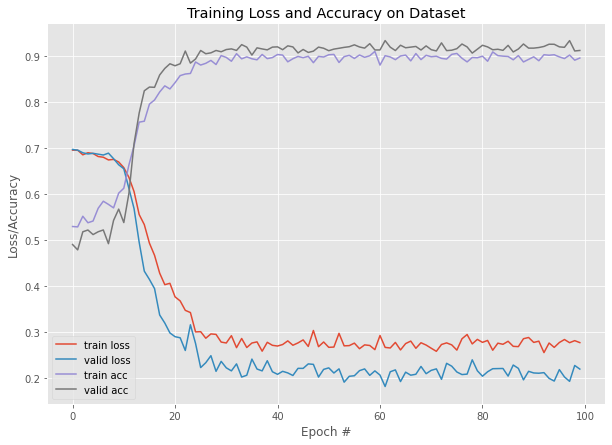

In [11]:
__trainer.load(last_checkpoint)
train_loss = __trainer.train_loss
valid_loss = __trainer.valid_loss
train_acc = __trainer.train_acc
valid_acc = __trainer.valid_acc


def save_plots(train_acc, valid_acc, train_loss, valid_loss):
    """
    Function to save the loss and accuracy plots to disk.
    """
    # accuracy plots
    # loss plots
    plt.figure(figsize=(10, 7))
    plt.plot(train_loss, label='train loss')
    plt.plot(valid_loss, label='valid loss')
    plt.plot(train_acc, label='train acc')
    plt.plot(valid_acc, label='valid acc')
    plt.title("Training Loss and Accuracy on Dataset")
    plt.xlabel("Epoch #")
    plt.ylabel("Loss/Accuracy")
    plt.legend(loc="lower left")
save_plots(train_acc, valid_acc, train_loss, valid_loss)

folder 		: /home/igofed/LiU/AI4Climate_/src/outputs/images is not available
folder 		: /home/igofed/LiU/AI4Climate_/src/outputs/images created


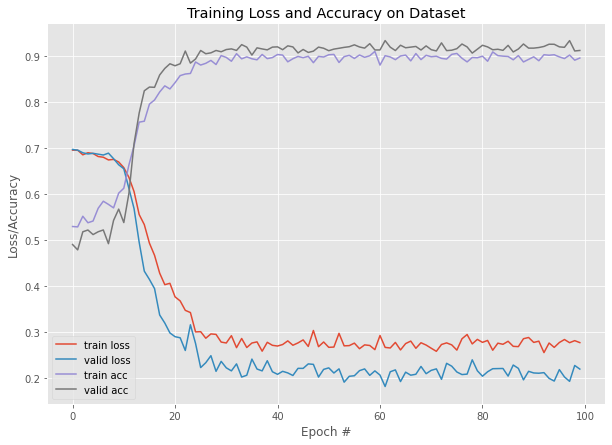

In [12]:
device = utils.select_device(gpu=False)
model_A = efficientnet.EfficientNet(
        version="efficientnet_b0",
        num_classes=2,
    ).to(device)


checkpoint = torch.load(last_checkpoint)
model_A.load_state_dict(checkpoint['model_state_dict'])
train_loss = checkpoint['train_loss']
train_acc = checkpoint['train_acc']
valid_loss = checkpoint['valid_loss']
valid_acc = checkpoint['valid_acc']
utils.save_plots(train_acc, valid_acc, train_loss, valid_loss, figure_name=last_checkpoint)
output_paths = os.path.join(os.getcwd(), 'outputs')
output_images = os.path.join(output_paths, 'images')
check_if_dir_existed(output_images, True)

/media/igofed/SSD_2T/DATASETS/weather_2/test
0 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/desktop_0509_1.png
1 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/desktop_0516_1.png
2 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/desktop_0229_1.png
3 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/desktop_0055_1.png
4 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/desktop_1058_1.png
5 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/mobile_0147_1.png
6 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class0/mobile_0400_0.png
7 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/desktop_1252_1.png
8 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class1/desktop_1647_1.png
9 /media/igofed/SSD_2T/DATASETS/weather_2/test/Class0/mainz_0033_0.png


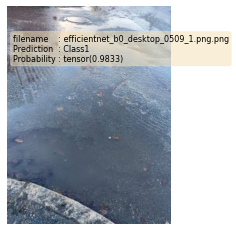

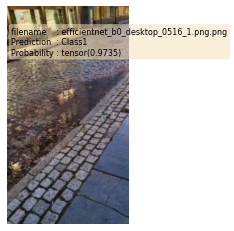

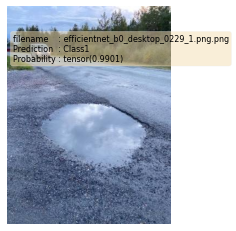

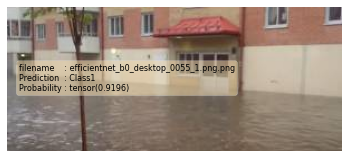

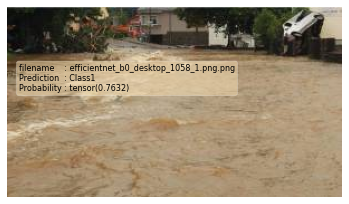

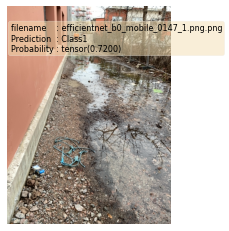

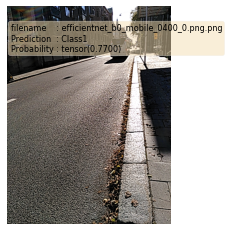

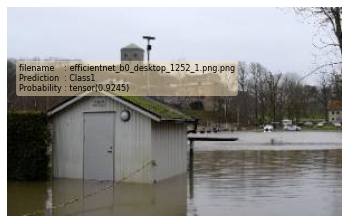

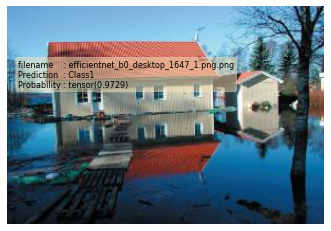

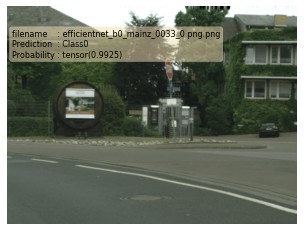

In [16]:
from pathlib import Path
import random
num_images_to_plot = 10
import torchvision
from torchvision import transforms
import cv2
from PIL import ImageFile, Image
print(test_path)
test_image_path_list = list(Path(test_path).glob("*/*.png")) # get list all image paths from test data 
test_image_path_sample = random.sample(population=test_image_path_list, # go through all of the test image paths
                                       k=num_images_to_plot) # randomly select 'k' image paths to pred and plot
i = 0

image_transform = transforms.Compose([
                    transforms.Resize((config.CFG.img_size, config.CFG.img_size)),
                    transforms.ToTensor(),
                    transforms.Normalize(
                        mean=config.CFG.mean, 
                        std=config.CFG.std)                
            ]
        )
model.to(device)
for image_path in test_image_path_sample:
    print(i, image_path)
        # Open image
    img = Image.open(image_path)
     # Turn on model evaluation mode and inference mode
    
    original_img = img.copy()
    model.eval()
    with torch.no_grad():
        # Transform and add an extra dimension to image (model requires samples in [batch_size, color_channels, height, width])
        transformed_image = image_transform(img).unsqueeze(dim=0)
        target_image_pred = model(transformed_image.to(device))
      # Convert logits -> prediction probabilities (using torch.softmax() for multi-class classification)
    target_image_pred_probs = torch.softmax(target_image_pred, dim=1)
    # Convert prediction probabilities -> prediction labels
    target_image_pred_label = torch.argmax(target_image_pred_probs, dim=1)
    # Plot image with predicted label and probability
    #cv2.putText(
    #        img, f"Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}",
    #        (10, 25), cv2.FONT_HERSHEY_SIMPLEX,
    #        1.0, (0, 255, 0), 2, lineType=cv2.LINE_AA
    #    )
    #   
    image_path = f"{output_images}/{model_name}_{os.path.basename(image_path)}.png"
    #cv2.imwrite(image_path, img)
    #original_img.save("img1.png")
    plt.figure()
    plt.imshow(original_img)
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

    textstr = '\n'.join((
                    r'filename    : %s' % (os.path.basename(image_path),),        
                    r'Prediction  : %s' % (class_names[target_image_pred_label]),
                    r'Probability : %s' % (target_image_pred_probs.max()),

                    ))
    plt.text(10, 50, textstr, fontsize=8, verticalalignment='top', bbox=props)
    #plt.title(
    #    f"{os.path.basename(image_path)} Pred: {class_names[target_image_pred_label]} | Prob: {target_image_pred_probs.max():.3f}"
    #)
    plt.axis(False)
    plt.savefig(image_path)
    i = i +1


from sklearn.metrics import accuracy_score

In [18]:
test_set, test_loader = load_dataset(test_path, mode='test', balance_dataset=False)

 [INFO]: Custom Loader for :	 test data 
Classes {'Class0': 0, 'Class1': 1} 
[INFO]: test Set:	477
	[INFO]: 144:	Class0 30.2%
	[INFO]: 333:	Class1 69.8%

[INFO] : Original test Set Size: 	477
	Num. of batches: 		15
	Num. of total examples: 	477
 ---------------------------------------


In [19]:
print(len(test_set))
print(device)

477
cpu


In [20]:
correct = 0
total = 0
import torch.nn.functional as F

def get_predictions(model, iterator, device):

    model.eval()

    images = []
    labels = []
    probs = []

    with torch.no_grad():

        for (x, y) in iterator:

            x = x.to(device)

            y_pred = model(x)

            y_prob = F.softmax(y_pred, dim=-1)

            images.append(x.cpu())
            labels.append(y.cpu())
            probs.append(y_prob.cpu())

    images = torch.cat(images, dim=0)
    labels = torch.cat(labels, dim=0)
    probs = torch.cat(probs, dim=0)

    return images, labels, probs


images, labels, probs = get_predictions(model, test_loader, device)
pred_labels = torch.argmax(probs, 1)



In [21]:
images, labels, probs = get_predictions(model, test_loader, device)
pred_labels = torch.argmax(probs, 1)
print(pred_labels, len(pred_labels), len(probs), len(images))

tensor([1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1,
        0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,
        1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0,
        1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1,
        1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0,
        1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 1,
        1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1,
        1, 1, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1,
        0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1,
        1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1,
        1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1,
        1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1,

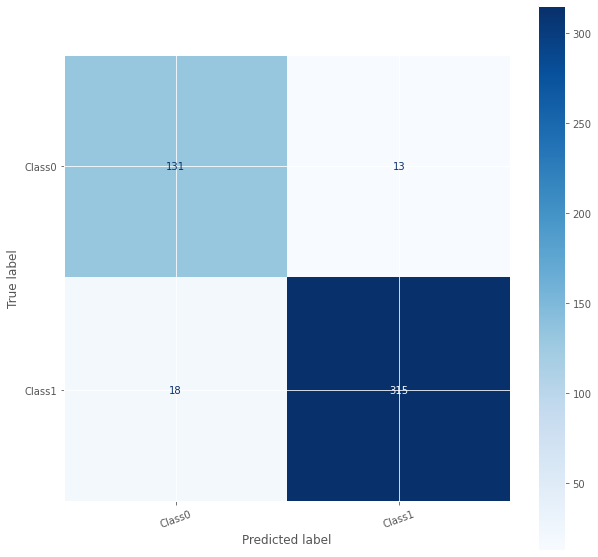

In [22]:
from sklearn import decomposition
from sklearn import manifold
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

def plot_confusion_matrix(labels, pred_labels, classes):

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(1, 1, 1)
    cm = confusion_matrix(labels, pred_labels)
    cm = ConfusionMatrixDisplay(cm, display_labels=classes)
    cm.plot(values_format='d', cmap='Blues', ax=ax)
    plt.xticks(rotation=20)


plot_confusion_matrix(labels, pred_labels, class_names)

In [42]:
corrects = torch.eq(labels, pred_labels)
incorrect_examples = []

for image, label, prob, correct in zip(images, labels, probs, corrects):
    if not correct:
        incorrect_examples.append((image, label, prob))

incorrect_examples.sort(reverse=True,
                        key=lambda x: torch.max(x[2], dim=0).values)


In [43]:


def normalize_image(image):
    image_min = image.min()
    image_max = image.max()
    image.clamp_(min=image_min, max=image_max)
    image.add_(-image_min).div_(image_max - image_min + 1e-5)
    return image

def plot_most_incorrect(incorrect, classes, n_images, normalize=True):

    rows = int(np.sqrt(n_images))
    cols = int(np.sqrt(n_images))

    fig = plt.figure(figsize=(25, 20))

    for i in range(rows*cols):

        ax = fig.add_subplot(rows, cols, i+1)

        image, true_label, probs = incorrect[i]
        image = image.permute(1, 2, 0)
        true_prob = probs[true_label]
        incorrect_prob, incorrect_label = torch.max(probs, dim=0)
        true_class = classes[true_label]
        incorrect_class = classes[incorrect_label]

        if normalize:
            image = normalize_image(image)

        ax.imshow(image.cpu().numpy())
        ax.set_title(f'true label: {true_class} ({true_prob:.3f})\n'
                     f'pred label: {incorrect_class} ({incorrect_prob:.3f})')
        ax.axis('off')

    fig.subplots_adjust(hspace=0.4)

plot_confusion_matrix(labels, pred_labels, class_names)

In [ ]:


y=[]
result = []
for images, labels in test_loader:
    images2=images.to(device)
    y_pred = model(images2).detach().cpu().numpy().argmax(axis=1).astype(int) 
    result.extend(y_pred)
    y.extend(labels)
    